<a href="https://colab.research.google.com/github/MohamedKhalidmk/DeepLearning/blob/main/stanford_dogs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_datasets as tfd
import pandas as pd
from tabulate import tabulate
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.layers import Input

In [17]:
dataset,info=tfd.load('stanford_dogs',as_supervised=True,with_info=True) #load data
info

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/stanford_dogs/incomplete.HDNV31_0.2.0/stanford_dogs-train.tfrecord*...:   …

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/stanford_dogs/incomplete.HDNV31_0.2.0/stanford_dogs-test.tfrecord*...:   0…

Dataset stanford_dogs downloaded and prepared to /root/tensorflow_datasets/stanford_dogs/0.2.0. Subsequent calls will reuse this data.


tfds.core.DatasetInfo(
    name='stanford_dogs',
    full_name='stanford_dogs/0.2.0',
    description="""
    The Stanford Dogs dataset contains images of 120 breeds of dogs from around the
    world. This dataset has been built using images and annotation from ImageNet for
    the task of fine-grained image categorization. There are 20,580 images, out of
    which 12,000 are used for training and 8580 for testing. Class labels and
    bounding box annotations are provided for all the 12,000 images.
    """,
    homepage='http://vision.stanford.edu/aditya86/ImageNetDogs/main.html',
    data_dir='/root/tensorflow_datasets/stanford_dogs/0.2.0',
    file_format=tfrecord,
    download_size=778.12 MiB,
    dataset_size=744.72 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=120),
        'objects': Sequence({
            'bbox': B

In [18]:
class_names=info.features['label'].names
class_names #120 dog breeds

['n02085620-chihuahua',
 'n02085782-japanese_spaniel',
 'n02085936-maltese_dog',
 'n02086079-pekinese',
 'n02086240-shih-tzu',
 'n02086646-blenheim_spaniel',
 'n02086910-papillon',
 'n02087046-toy_terrier',
 'n02087394-rhodesian_ridgeback',
 'n02088094-afghan_hound',
 'n02088238-basset',
 'n02088364-beagle',
 'n02088466-bloodhound',
 'n02088632-bluetick',
 'n02089078-black-and-tan_coonhound',
 'n02089867-walker_hound',
 'n02089973-english_foxhound',
 'n02090379-redbone',
 'n02090622-borzoi',
 'n02090721-irish_wolfhound',
 'n02091032-italian_greyhound',
 'n02091134-whippet',
 'n02091244-ibizan_hound',
 'n02091467-norwegian_elkhound',
 'n02091635-otterhound',
 'n02091831-saluki',
 'n02092002-scottish_deerhound',
 'n02092339-weimaraner',
 'n02093256-staffordshire_bullterrier',
 'n02093428-american_staffordshire_terrier',
 'n02093647-bedlington_terrier',
 'n02093754-border_terrier',
 'n02093859-kerry_blue_terrier',
 'n02093991-irish_terrier',
 'n02094114-norfolk_terrier',
 'n02094258-norwi

<ipython-input-19-ffe1d620f605>:17: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout(pad=2.0)  # Add more padding to avoid overlap


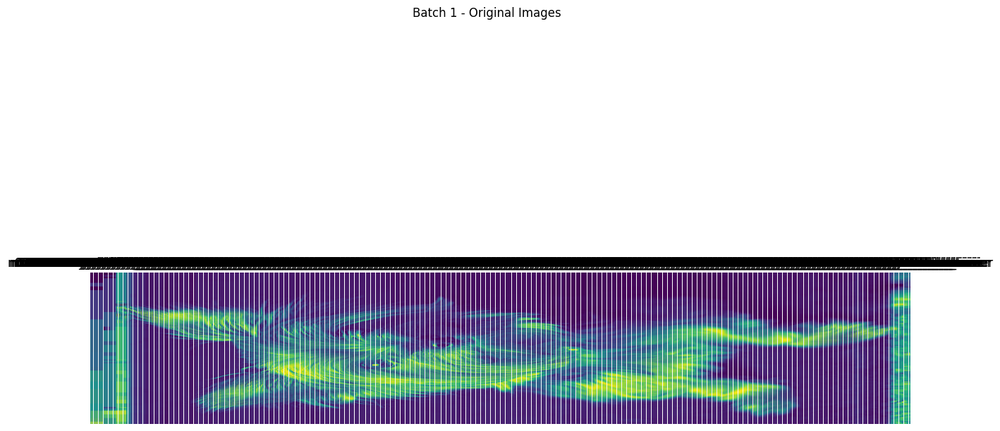

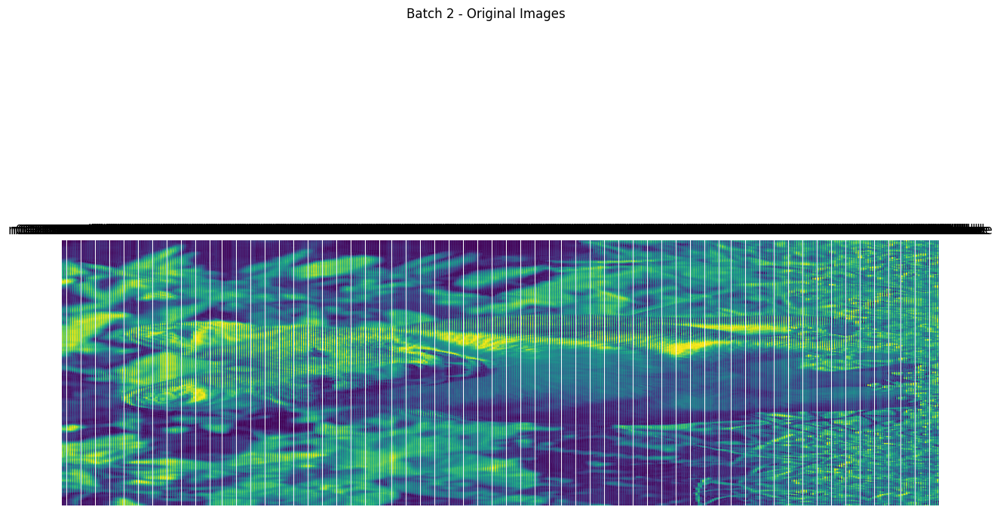

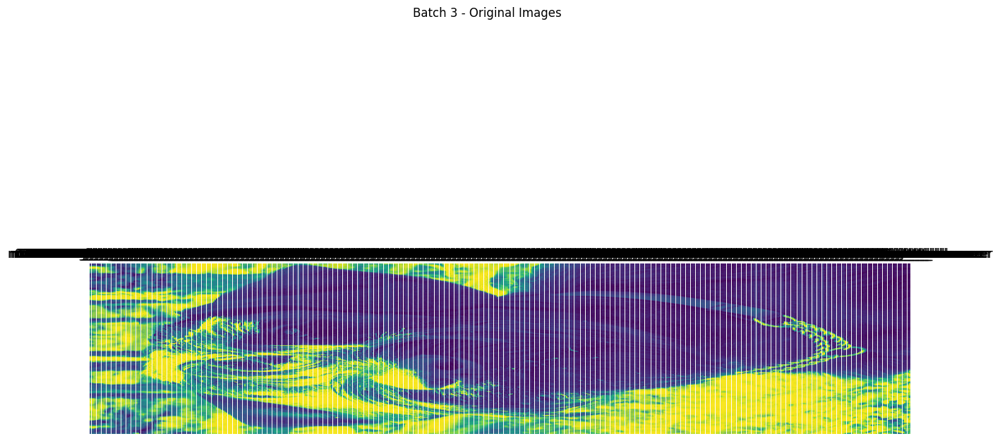

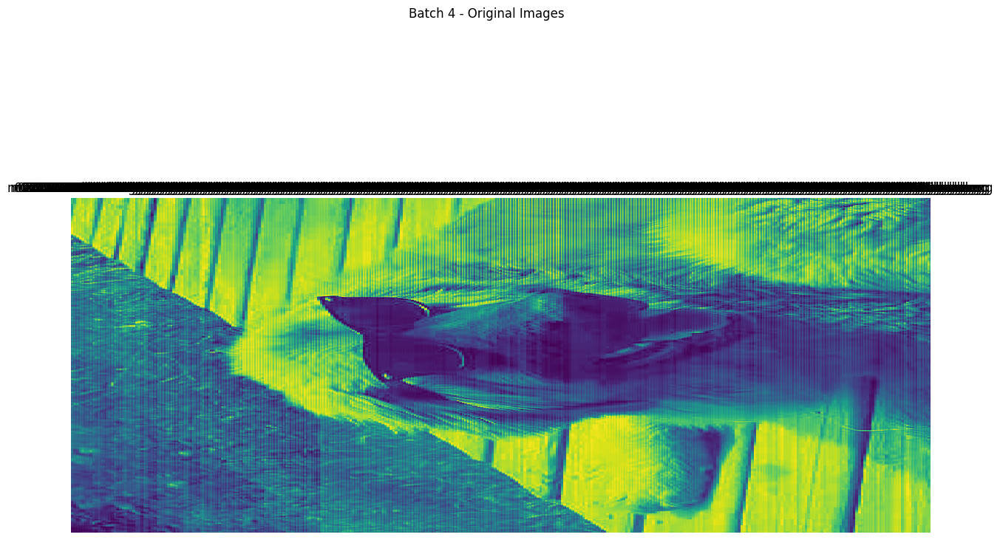

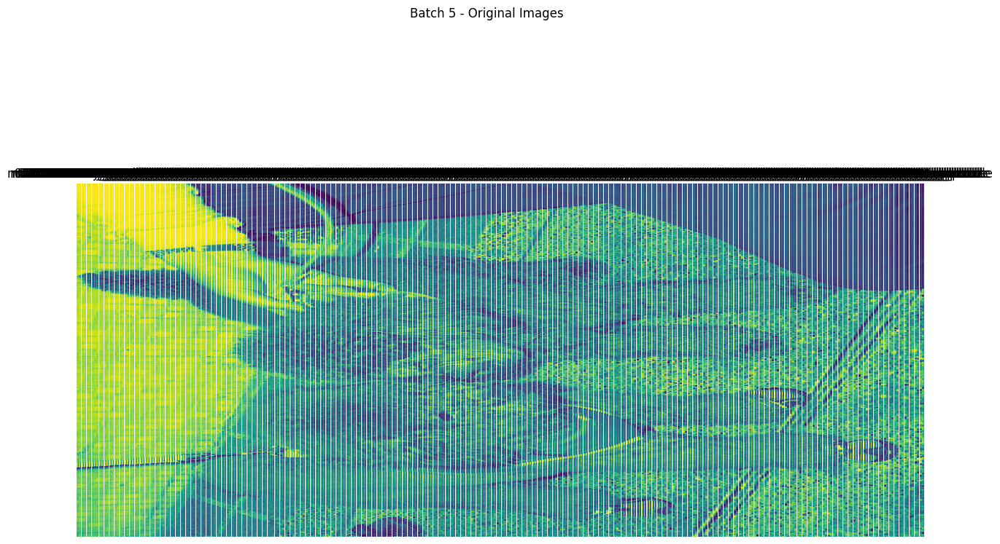

In [19]:
for batch_num, (images, labels) in enumerate(dataset['train'].take(5)): #printing 5 samples from 5 batches of training set
    plt.figure(figsize=(15, 10))

    num_images = len(images)
    for i in range(num_images):
        ax = plt.subplot(1, num_images, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        # Access label directly (assuming it's scalar)
        label_index = labels.numpy()

        # map label index to breed name
        plt.title(class_names[label_index])
        plt.axis("off")

    plt.suptitle(f"Batch {batch_num + 1} - Original Images")
    plt.tight_layout(pad=2.0)  # Add more padding to avoid overlap
    plt.show()


In [36]:
data_augmentation = tf.keras.Sequential([                    #data augmentation layer
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.02),      # smaller rotation
    tf.keras.layers.RandomZoom(0.02),          # smaller zoom
    tf.keras.layers.RandomContrast(0.05),      # milder contrast
])

<ipython-input-21-0a348f85d7af>:19: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout(pad=2.0)


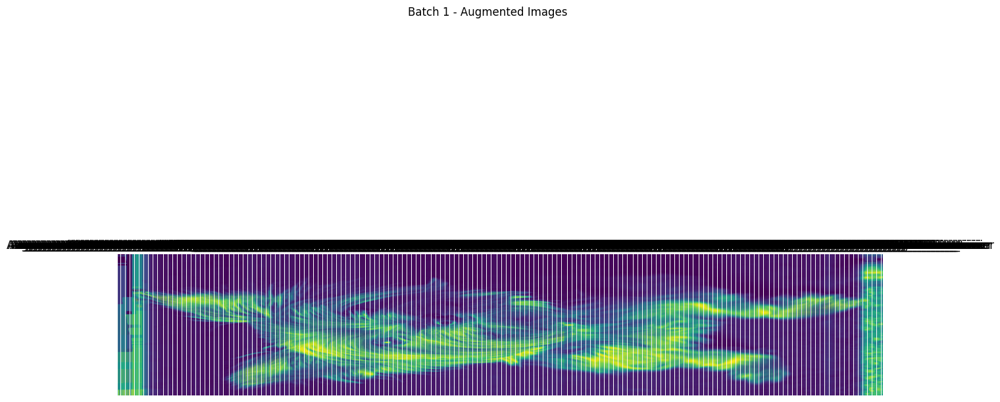

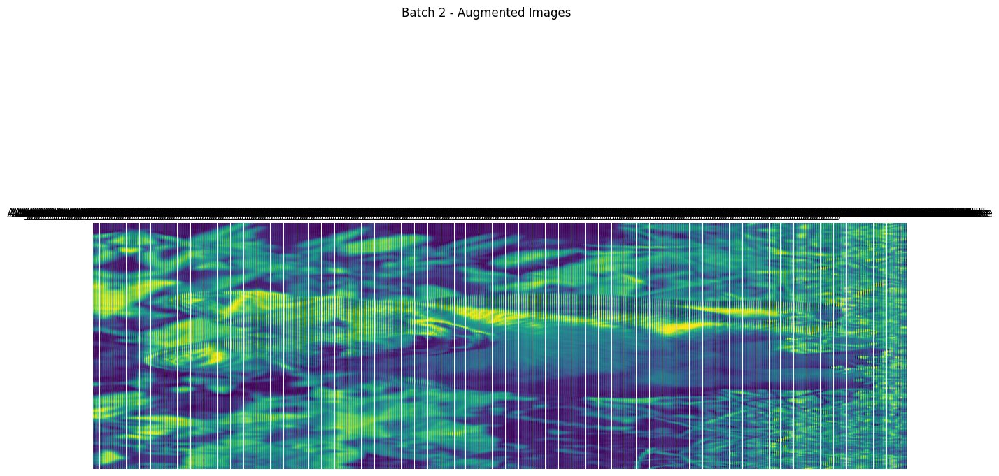

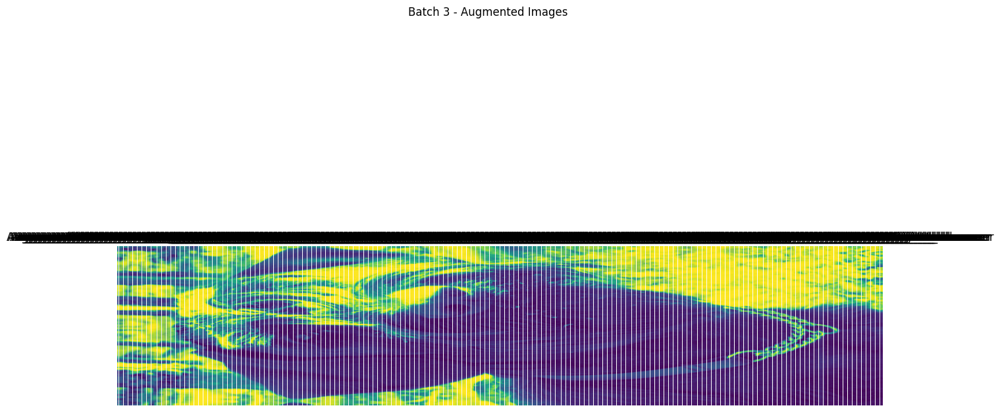

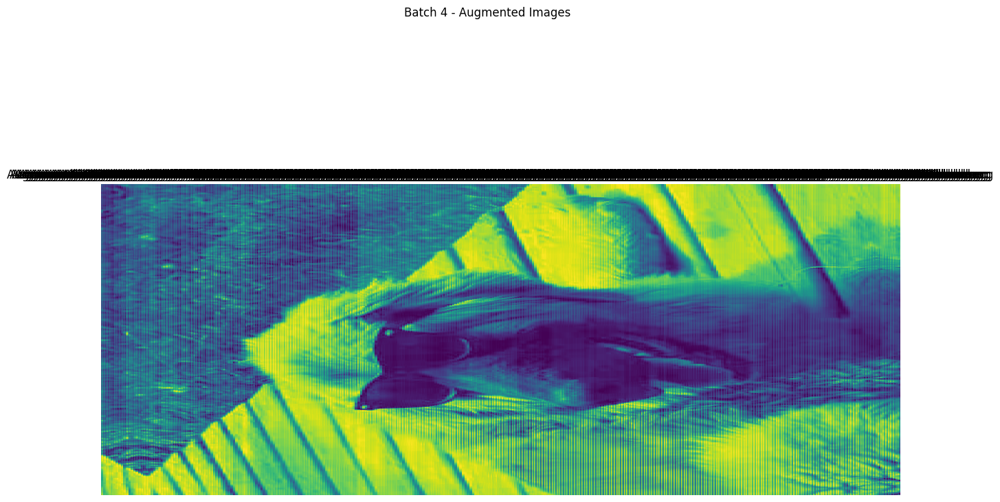

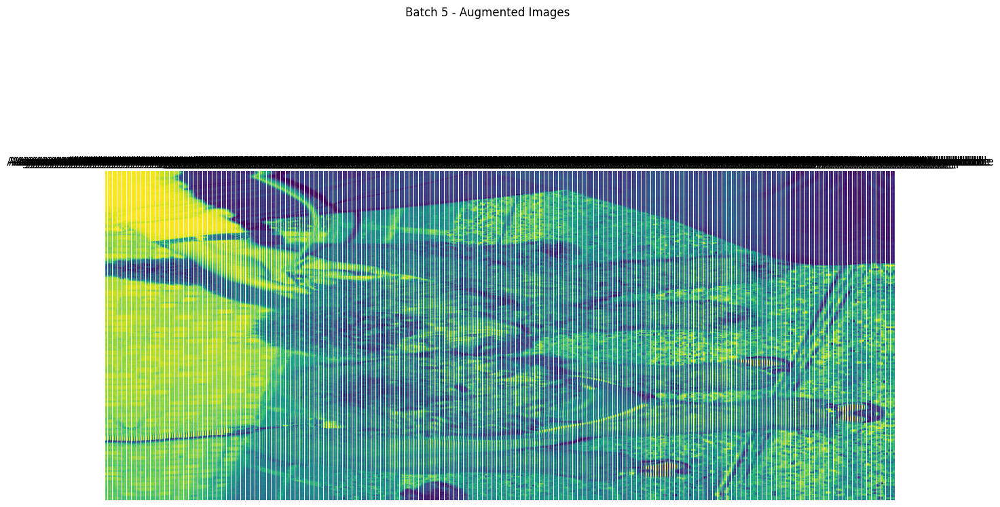

In [21]:
for batch_num, (images, labels) in enumerate(dataset['train'].take(5)): #print 5 batches with augmentation
    plt.figure(figsize=(15, 10))

    num_images = len(images)

    # Apply resizing + augmentation
    augmented_images = data_augmentation(images)

    for i in range(num_images):
        ax = plt.subplot(1, num_images, i + 1)
        plt.imshow(augmented_images[i].numpy().astype("uint8"))

        # labels is a scalar
        label_index = labels.numpy()
        plt.title(f"Augmented {class_names[label_index]}")
        plt.axis("off")

    plt.suptitle(f"Batch {batch_num + 1} - Augmented Images")
    plt.tight_layout(pad=2.0)
    plt.show()

In [33]:
# Correct split of the dataset
X_train = tfd.load('stanford_dogs', split='train[:80%]', as_supervised=True)
X_val = tfd.load('stanford_dogs', split='train[80%:]', as_supervised=True)
X_test = tfd.load('stanford_dogs', split='test', as_supervised=True)
IMG_SIZE = 224
BATCH_SIZE = 32
# Preprocessing function with proper resizing and normalization
def preprocess(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))  # Resize to match model input
    image = preprocess_input(image)  # Normalize pixel values
    return image, label
# Apply preprocessing
X_train = X_train.map(preprocess).shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
X_val = X_val.map(preprocess).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
X_test = X_test.map(preprocess).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
# Check dataset cardinality (number of batches)
print("Training batches:", X_train.cardinality().numpy())
print("Validation batches:", X_val.cardinality().numpy())
print("Test batches:", X_test.cardinality().numpy())

Training batches: 300
Validation batches: 75
Test batches: 269


In [34]:
base_model=tf.keras.applications.ResNet50(include_top=False,input_shape=(IMG_SIZE,IMG_SIZE,3)) #resnet50 model
base_model.trainable=False

In [24]:
# Build the model without augmentation
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dense(120, activation='softmax')  # 120 dog breeds
])

In [25]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [26]:
history=model.fit(X_train, epochs=10, validation_data=X_val)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 69s 176ms/step - accuracy: 0.4474 - loss: 2.4477 - val_accuracy: 0.7038 - val_loss: 1.0033
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 60s 122ms/step - accuracy: 0.8087 - loss: 0.6144 - val_accuracy: 0.7133 - val_loss: 0.9931
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 40s 120ms/step - accuracy: 0.8786 - loss: 0.3744 - val_accuracy: 0.7308 - val_loss: 0.9417
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - accuracy: 0.9315 - loss: 0.2149 - val_accuracy: 0.7462 - val_loss: 0.9282
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - accuracy: 0.9563 - loss: 0.1453 - val_accuracy: 0.7421 - val_loss: 1.0223
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - accuracy: 0.9608 - loss: 0.1235 - val_accuracy: 0.7408 - val_loss: 1.0671
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 38s 120ms/step - accuracy: 0.9656 - loss: 0.1087 - val_accuracy: 0.7362 - val_loss: 1.1474
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 42s 133ms/step - accuracy: 0.9653 - loss: 0

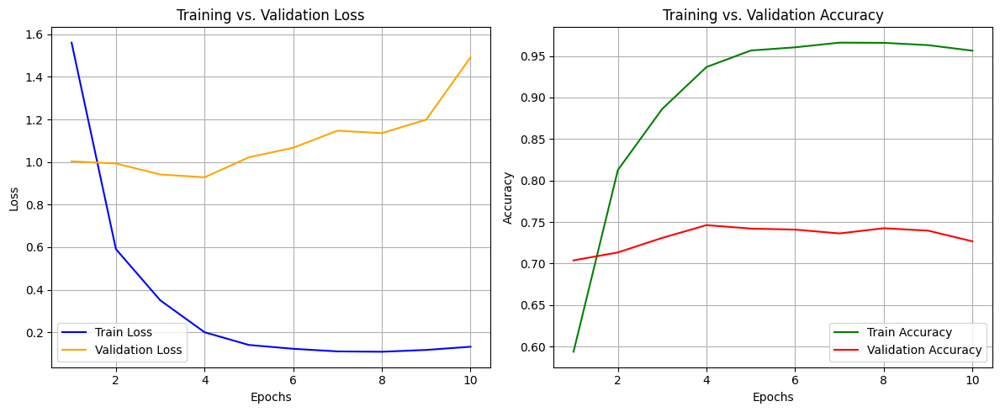

In [28]:
train_loss=model.history.history['loss']
val_loss=model.history.history['val_loss']
train_acc=model.history.history['accuracy']
val_acc=model.history.history['val_accuracy']
epochs=range(1,len(train_loss)+1)

plt.figure(figsize=(12, 5))

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Train Loss', color='blue')
plt.plot(epochs, val_loss, label='Validation Loss', color='orange')
plt.title("Training vs. Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc, label='Train Accuracy', color='green')
plt.plot(epochs, val_acc, label='Validation Accuracy', color='red')
plt.title("Training vs. Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [29]:
model.evaluate(X_test)

269/269 ━━━━━━━━━━━━━━━━━━━━ 28s 104ms/step - accuracy: 0.7244 - loss: 1.4528


[1.4208042621612549, 0.7255244851112366]

In [37]:
# Build the model with augmentation
model_aug = tf.keras.Sequential([
    data_augmentation,
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dense(120, activation='softmax')  # 120 dog breeds
])

In [38]:
model_aug.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [39]:
hist_aug=model_aug.fit(X_train, epochs=10, validation_data=X_val)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 66s 181ms/step - accuracy: 0.1942 - loss: 3.7641 - val_accuracy: 0.5800 - val_loss: 1.3884
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 77s 169ms/step - accuracy: 0.4620 - loss: 1.9811 - val_accuracy: 0.6087 - val_loss: 1.3038
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 168ms/step - accuracy: 0.5499 - loss: 1.6163 - val_accuracy: 0.6192 - val_loss: 1.2334
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 169ms/step - accuracy: 0.6116 - loss: 1.3482 - val_accuracy: 0.6371 - val_loss: 1.2655
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 54s 171ms/step - accuracy: 0.6841 - loss: 1.0802 - val_accuracy: 0.6137 - val_loss: 1.4042
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 168ms/step - accuracy: 0.7401 - loss: 0.8767 - val_accuracy: 0.6321 - val_loss: 1.3610
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 168ms/step - accuracy: 0.7804 - loss: 0.7285 - val_accuracy: 0.6283 - val_loss: 1.4776
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 54s 171ms/step - accuracy: 0.8163 - loss: 0

In [40]:
model_aug.evaluate(X_test)

269/269 ━━━━━━━━━━━━━━━━━━━━ 34s 126ms/step - accuracy: 0.6258 - loss: 1.5939


[1.5850471258163452, 0.6258741021156311]

### **OVERFITTING:**

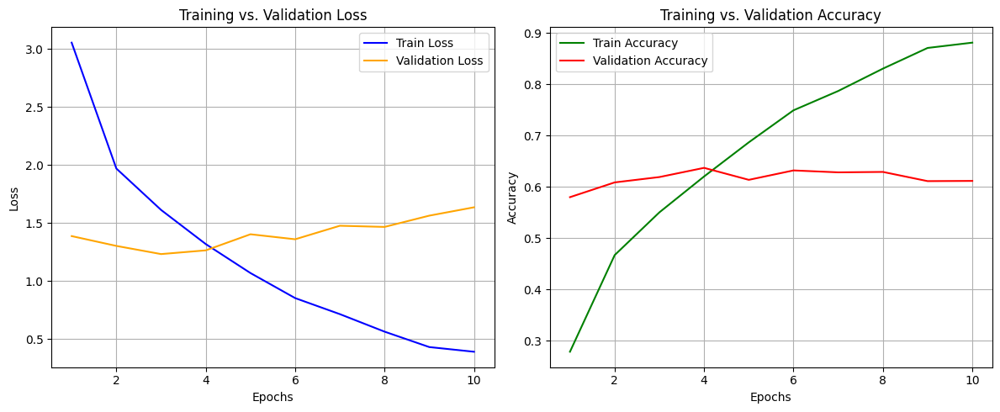

In [41]:
train_loss_aug=hist_aug.history['loss']
val_loss_aug=hist_aug.history['val_loss']
train_acc_aug=hist_aug.history['accuracy']
val_acc_aug=hist_aug.history['val_accuracy']
epochs=range(1,len(train_loss_aug)+1)

# Plot Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss_aug, label='Train Loss', color='blue')
plt.plot(epochs, val_loss_aug, label='Validation Loss', color='orange')
plt.title("Training vs. Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs, train_acc_aug, label='Train Accuracy', color='green')
plt.plot(epochs, val_acc_aug, label='Validation Accuracy', color='red')
plt.title("Training vs. Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

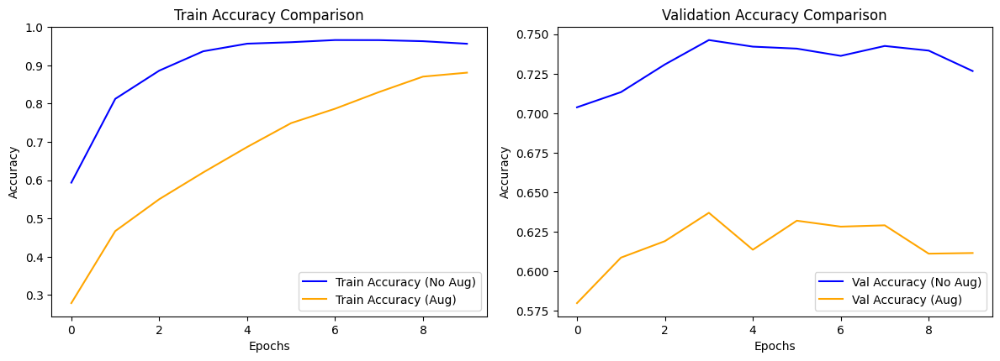

In [42]:
    plt.figure(figsize=(12, 8))

    # Plot train accuracy comparison between the two models
    plt.subplot(2, 2, 3)
    plt.plot(history.history['accuracy'], label='Train Accuracy (No Aug)', color='blue')
    plt.plot(hist_aug.history['accuracy'], label='Train Accuracy (Aug)', color='orange')
    plt.title('Train Accuracy Comparison')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot validation accuracy comparison between the two models
    plt.subplot(2, 2, 4)
    plt.plot(history.history['val_accuracy'], label='Val Accuracy (No Aug)', color='blue')
    plt.plot(hist_aug.history['val_accuracy'], label='Val Accuracy (Aug)', color='orange')
    plt.title('Validation Accuracy Comparison')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [43]:
# Create the results data
results_data = [
    ['Pretrained_no_aug',
     round(history.history['loss'][-1], 4),
     round(history.history['accuracy'][-1], 4),
     round(history.history['val_loss'][-1], 4),
     round(history.history['val_accuracy'][-1], 4)],

    ['Pretrained_aug',
     round(hist_aug.history['loss'][-1], 4),
     round(hist_aug.history['accuracy'][-1], 4),
     round(hist_aug.history['val_loss'][-1], 4),
     round(hist_aug.history['val_accuracy'][-1], 4)]
]

# Define headers
headers = ['Model', 'Train Loss', 'Train Accuracy', 'Validation Loss', 'Validation Accuracy']

# Print the tabulated results
print(tabulate(results_data, headers=headers, tablefmt='fancy_grid'))


╒═══════════════════╤══════════════╤══════════════════╤═══════════════════╤═══════════════════════╕
│ Model             │   Train Loss │   Train Accuracy │   Validation Loss │   Validation Accuracy │
╞═══════════════════╪══════════════╪══════════════════╪═══════════════════╪═══════════════════════╡
│ Pretrained_no_aug │       0.1321 │           0.9565 │            1.4921 │                0.7267 │
├───────────────────┼──────────────┼──────────────────┼───────────────────┼───────────────────────┤
│ Pretrained_aug    │       0.3914 │           0.8809 │            1.6367 │                0.6117 │
╘═══════════════════╧══════════════╧══════════════════╧═══════════════════╧═══════════════════════╛
